# Google Vision Model

In order to understand specific traits that make murals more likely have higher engagement online, we collected objetcs and labels from the Google Vision API, and ran a random forest regressor and clasification model.

## Dataframe for Classification Model 

In [ ]:
import pandas as pd
Df = pd.read_excel('https://github.com/mariasohail2/Social_Media_Analytics/raw/main/Google_Vision_DF.xlsx')

In [ ]:
Df

,Unnamed: 0,Caption,Comments,Likes,URL,Object_Num,Object_0_score,Object_1_score,Object_2_score,Object_3_score,...,Label_3,Label_4,Label_5,Label_6,Label_7,Label_8,Label_9,Labels_Objects_Names,Labels_Objects_Scores,Engagement
0,0,“Always Stay Hungry” - work by @sasha.korban f...,3,175,https://scontent-atl3-1.cdninstagram.com/v/t51...,2,0.781665,0.530012,NaN,NaN,...,Window,Infrastructure,Street fashion,Automotive lighting,Eyewear,Art,Neighbourhood,"['Building', 'Car', 'White', 'Window', 'Infras...","['0.964320719242096', '0.933414101600647', '0....",525
1,1,Work by @ronenglish on the famed Houston Bower...,2,115,https://scontent-atl3-1.cdninstagram.com/v/t51...,1,0.710405,NaN,NaN,NaN,...,Brick,Building,Facade,Mural,Rectangle,City,Illustration,"['Painting', 'Art', 'Graffiti', 'Brick', 'Buil...","['0.8222779035568237', '0.8212408423423767', '...",230
2,2,New work by @invaderwashere in Slovenia. 👾,2,111,https://scontent-atl3-1.cdninstagram.com/v/t51...,1,0.929607,NaN,NaN,NaN,...,Line,Gas,Symmetry,Pattern,Creative arts,Illustration,Wood,"['Rectangle', 'Art', 'Font', 'Line', 'Gas', 'S...","['0.8679025769233704', '0.8473606109619141', '...",222
3,3,"Work by @davidzinn in Ann Arbor, Michigan.",30,3289,https://scontent-atl3-1.cdninstagram.com/v/t51...,0,NaN,NaN,NaN,NaN,...,Brick,Building material,Wall,Line,Composite material,Pattern,Wood,"['Building', 'Rectangle', 'Brickwork', 'Brick'...","['0.8826923370361328', '0.8644804954528809', '...",98670
4,4,"“Touché, coulé” - new work by @matth.velvet in...",2,189,https://scontent-atl3-1.cdninstagram.com/v/t51...,4,0.695513,0.635542,0.555453,0.550535,...,Building,Paint,Azure,Art paint,Infrastructure,Urban design,Art,"['Sky', 'Daytime', 'Window', 'Building', 'Pain...","['0.9444730877876282', '0.9441952705383301', '...",378
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1082,841,"@findac wall in Paris, France 🇫🇷(2018)\n•\n#fi...",23,4403,https://scontent-bos3-1.cdninstagram.com/v/t51...,4,0.730663,0.568791,0.561120,0.525850,...,World,Sculpture,Statue,Art,Facade,Monument,City,"['Sky', 'Building', 'Window', 'World', 'Sculpt...","['0.958717942237854', '0.9427456855773926', '0...",101269
1083,842,"@artofdavidwalker wall in Nancy, France 🇫🇷(201...",62,9424,https://scontent-bos3-1.cdninstagram.com/v/t51...,10,0.866586,0.861993,0.858894,0.820464,...,Daytime,Bicycle wheel,Building,Infrastructure,Human,Paint,Painting,"['Bicycle', 'Tire', 'Wheel', 'Daytime', 'Bicyc...","['0.973189115524292', '0.9658660292625427', '0...",584288
1084,843,"@smeetsbart wall in Brussels, Belgium 🇧🇪(2018)...",18,3360,https://scontent-bos3-1.cdninstagram.com/v/t51...,5,0.888641,0.665505,0.660465,0.652895,...,Sneakers,Flooring,Rolling,Floor,Wall,Recreation,Walking shoe,"['Shoe', 'Art', 'Grey', 'Sneakers', 'Flooring'...","['0.9540275931358337', '0.8576368093490601', '...",60480
1085,844,"@fintan_magee wall in Munich, Germany 🇩🇪(2018)...",21,2463,https://scontent-bos3-1.cdninstagram.com/v/t51...,5,0.909237,0.842865,0.769731,0.751040,...,Building,Sky,Flash photography,Waist,Standing,Shorts,Thigh,"['Arm', 'Shoulder', 'Window', 'Building', 'Sky...","['0.943327784538269', '0.9427759647369385', '0...",51723


## Dataframe exploration

In [ ]:
Df.shape

(1087, 52)

In [ ]:
Df.dtypes

Unnamed: 0                 int64
Caption                   object
Comments                   int64
Likes                      int64
URL                       object
Object_Num                 int64
Object_0_score           float64
Object_1_score           float64
Object_2_score           float64
Object_3_score           float64
Object_4_score           float64
Object_5_score           float64
Object_6_score           float64
Object_7_score           float64
Object_8_score           float64
Object_9_score           float64
Object_0                  object
Object_1                  object
Object_2                  object
Object_3                  object
Object_4                  object
Object_5                  object
Object_6                  object
Object_7                  object
Object_8                  object
Object_9                  object
Total_Objects_Names       object
Total_Objects_Scores      object
Label_Num                  int64
Label_0_score            float64
Label_1_sc

In [ ]:
Df.describe()

,Unnamed: 0,Comments,Likes,Object_Num,Object_0_score,Object_1_score,Object_2_score,Object_3_score,Object_4_score,Object_5_score,...,Label_1_score,Label_2_score,Label_3_score,Label_4_score,Label_5_score,Label_6_score,Label_7_score,Label_8_score,Label_9_score,Engagement
count,1087.000000,1087.000000,1087.000000,1087.000000,997.000000,726.000000,467.000000,273.000000,149.000000,90.000000,...,1087.000000,1087.000000,1087.000000,1087.000000,1087.000000,1087.000000,1087.000000,1087.000000,1087.000000,1.087000e+03
mean,355.494020,18.575897,2979.542778,2.607176,0.753297,0.686424,0.661448,0.633126,0.628052,0.619949,...,0.904209,0.882063,0.860434,0.841626,0.823771,0.808347,0.794697,0.781698,0.768833,9.226353e+04
std,251.226263,17.632986,2350.850305,1.997527,0.110441,0.118427,0.110818,0.106450,0.103465,0.098964,...,0.045743,0.047221,0.047877,0.049553,0.049854,0.050606,0.051704,0.053487,0.054865,1.728343e+05
min,0.000000,0.000000,36.000000,0.000000,0.502230,0.500235,0.500519,0.501217,0.501826,0.501382,...,0.735335,0.714697,0.695036,0.648818,0.619013,0.576841,0.560785,0.555937,0.547957,0.000000e+00
25%,138.000000,7.000000,1572.500000,1.000000,0.670820,0.583613,0.569903,0.539280,0.544569,0.546631,...,0.869562,0.847138,0.827962,0.812953,0.794793,0.776939,0.764465,0.746890,0.729657,8.439000e+03
50%,296.000000,14.000000,2695.000000,2.000000,0.758322,0.676041,0.641932,0.611584,0.602569,0.580548,...,0.908614,0.885453,0.856735,0.842363,0.825841,0.813055,0.800700,0.785391,0.773487,3.865400e+04
75%,572.500000,24.000000,4091.000000,4.000000,0.845269,0.786003,0.741921,0.711291,0.694006,0.685192,...,0.944173,0.921383,0.895991,0.873122,0.852605,0.839360,0.825712,0.816739,0.807615,9.587200e+04
max,845.000000,116.000000,15050.000000,10.000000,0.957553,0.949497,0.937749,0.920158,0.916395,0.905129,...,0.983583,0.979342,0.972146,0.972103,0.952499,0.952078,0.944979,0.942760,0.940438,1.610350e+06


In [ ]:
Obj_Score = Df[['Object_0_score','Object_1_score','Object_2_score','Object_3_score','Object_4_score','Object_5_score','Object_6_score','Object_7_score','Object_8_score','Object_9_score']]
Obj_Score.describe()

,Object_0_score,Object_1_score,Object_2_score,Object_3_score,Object_4_score,Object_5_score,Object_6_score,Object_7_score,Object_8_score,Object_9_score
count,997.000000,726.000000,467.000000,273.000000,149.000000,90.000000,60.000000,34.000000,21.000000,17.000000
mean,0.753297,0.686424,0.661448,0.633126,0.628052,0.619949,0.613832,0.621844,0.636475,0.607601
std,0.110441,0.118427,0.110818,0.106450,0.103465,0.098964,0.096632,0.106575,0.104228,0.105299
min,0.502230,0.500235,0.500519,0.501217,0.501826,0.501382,0.501778,0.501374,0.507462,0.503003
25%,0.670820,0.583613,0.569903,0.539280,0.544569,0.546631,0.532327,0.534151,0.561860,0.536705
50%,0.758322,0.676041,0.641932,0.611584,0.602569,0.580548,0.591142,0.604834,0.609858,0.573328
75%,0.845269,0.786003,0.741921,0.711291,0.694006,0.685192,0.673057,0.672996,0.690495,0.628392
max,0.957553,0.949497,0.937749,0.920158,0.916395,0.905129,0.877129,0.863836,0.863502,0.862736


As seen above, Object_0_score tends to have the highest accuracy score of 75%. The object right after it has a big decline in accuracy to 69%. In order to maintain the integrity of the dataset, we will attempt to limit the number of objects in this dataset to have more accurate predictions.

In [ ]:
Label_Score = Df[['Label_0_score','Label_1_score','Label_2_score','Label_3_score','Label_4_score','Label_5_score','Label_6_score','Label_7_score','Label_8_score','Label_9_score']]
Label_Score.describe()

,Label_0_score,Label_1_score,Label_2_score,Label_3_score,Label_4_score,Label_5_score,Label_6_score,Label_7_score,Label_8_score,Label_9_score
count,1087.000000,1087.000000,1087.000000,1087.000000,1087.000000,1087.000000,1087.000000,1087.000000,1087.000000,1087.000000
mean,0.931336,0.904209,0.882063,0.860434,0.841626,0.823771,0.808347,0.794697,0.781698,0.768833
std,0.039630,0.045743,0.047221,0.047877,0.049553,0.049854,0.050606,0.051704,0.053487,0.054865
min,0.784327,0.735335,0.714697,0.695036,0.648818,0.619013,0.576841,0.560785,0.555937,0.547957
25%,0.907614,0.869562,0.847138,0.827962,0.812953,0.794793,0.776939,0.764465,0.746890,0.729657
50%,0.943960,0.908614,0.885453,0.856735,0.842363,0.825841,0.813055,0.800700,0.785391,0.773487
75%,0.961807,0.944173,0.921383,0.895991,0.873122,0.852605,0.839360,0.825712,0.816739,0.807615
max,0.988098,0.983583,0.979342,0.972146,0.972103,0.952499,0.952078,0.944979,0.942760,0.940438


Labels on average have a much higher accuracy in comparison to Objects. In fact, the lowest accuracy for the labels is still higehr than the accuracy for the objects.

### Missing Values

In [ ]:
#Checking for missing values
def missing_values(df):
    mis_val = df.isnull().sum()
    mis_val_percent = 100 * df.isnull().sum() / len(df)
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
    mis_val_table_ren_columns = mis_val_table.rename(columns={
        0: 'Missing Values',
        1: '% of Total Values'
    })
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:, 1] != 0].sort_values(
            '% of Total Values', ascending=False).round(1)
    print("Dataframe has " + str(df.shape[1]) + " columns.")
    print("There are " + str(mis_val_table_ren_columns.shape[0]) +
          " columns that have missing values.")
    
    return mis_val_table_ren_columns

# Missing values statistics
miss_values = missing_values(Df)
miss_values

Dataframe has 52 columns.
There are 20 columns that have missing values.


,Missing Values,% of Total Values
Object_9,1070,98.4
Object_9_score,1070,98.4
Object_8_score,1066,98.1
Object_8,1066,98.1
Object_7_score,1053,96.9
Object_7,1053,96.9
Object_6_score,1027,94.5
Object_6,1027,94.5
Object_5_score,997,91.7
Object_5,997,91.7


All the objects have high amount of missing values. The lowest one being Object_0. 

### Variable Analysis 

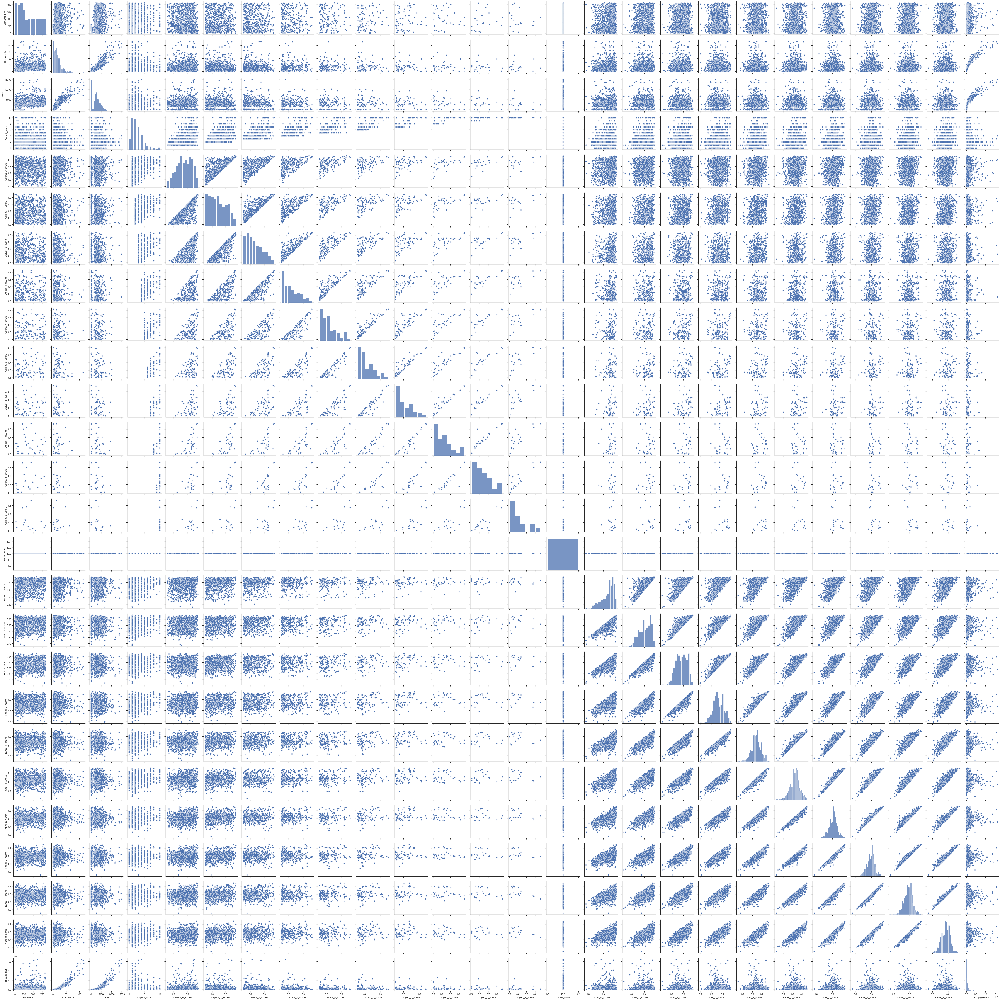

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="ticks")

sns.pairplot(Df, palette="Set1")
plt.show()

Text(0.5, 1.0, 'Number of Objects Distribution')

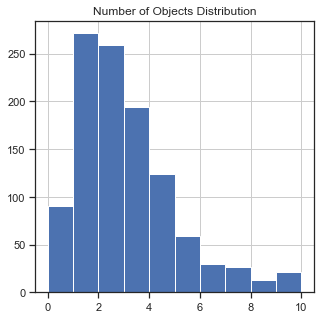

In [ ]:
plt.figure(figsize=(5,5))
Df["Object_Num"].hist()
plt.title("Number of Objects Distribution")

### Exploring Engagement Variables

Text(0.5, 1.0, 'Number of Comments Distribution')

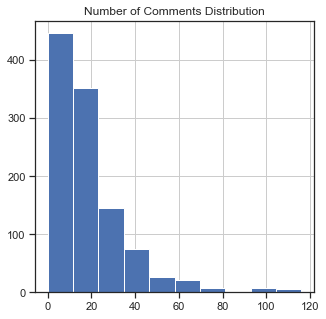

In [ ]:
plt.figure(figsize=(5,5))
Df["Comments"].hist()
plt.title("Number of Comments Distribution")

Text(0.5, 1.0, 'Number of Likes Distribution')

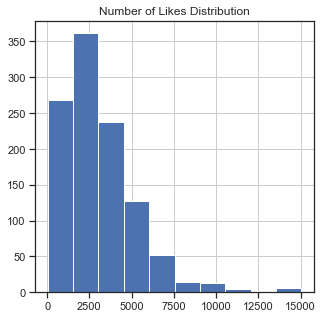

In [ ]:
plt.figure(figsize=(5,5))
Df["Likes"].hist()
plt.title("Number of Likes Distribution")

Comments and likes are two different types of enagagement variables. In order to have one metric that captures aspects of both, we will create a new variable.

### Numerical Variables

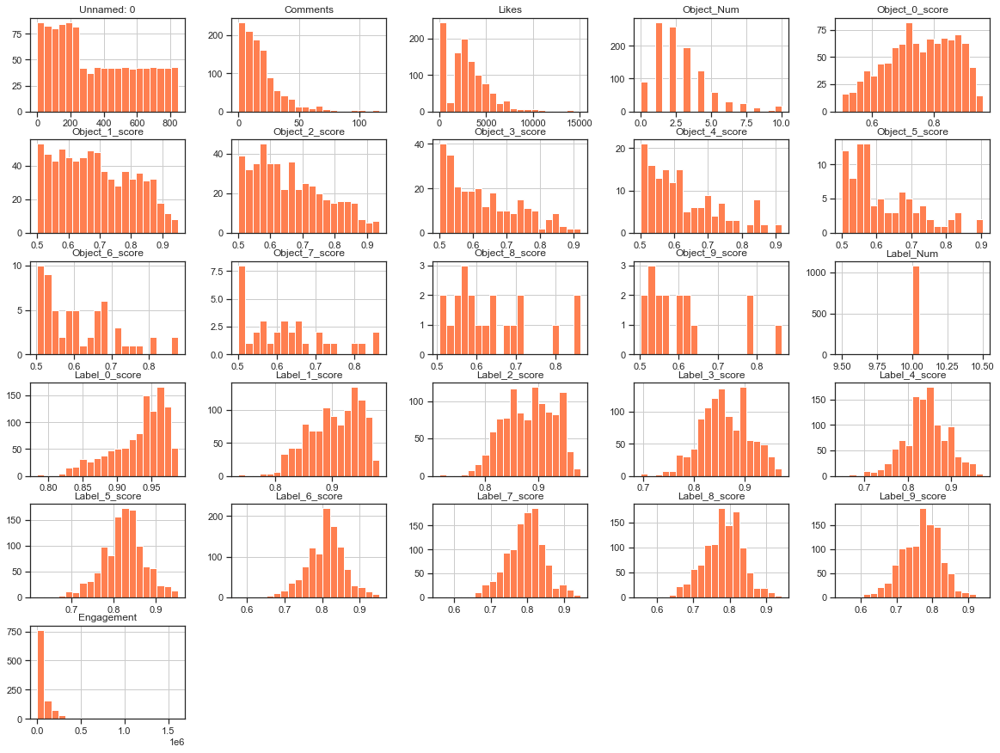

In [ ]:
Df.hist(bins=20, figsize=(20,15), color='coral')
plt.show();

### Categorical Variables

### Objects

In [ ]:
#Getting value counts for each column
for g in range(0,10):
     print(Df["Object_"+str(g)].value_counts())

Person            412
Building          161
Animal             73
Window             46
Packaged goods     36
                 ... 
Fruit               1
2D barcode          1
Overall             1
Truck               1
Toilet              1
Name: Object_0, Length: 76, dtype: int64
 Person        193
 Building      139
 Window         46
 Animal         46
 Clothing       34
              ... 
 Raccoon         1
 Boot            1
 Skirt           1
 Houseplant      1
 Cat             1
Name: Object_1, Length: 68, dtype: int64
 Person       103
 Building      85
 Window        39
 Animal        28
 Clothing      24
             ... 
 Flowerpot      1
 Sink           1
 Dog            1
 Butterfly      1
 Tableware      1
Name: Object_2, Length: 61, dtype: int64
 Person                   52
 Building                 50
 Window                   29
 Shoe                     19
 Clothing                 15
 Animal                   13
 Car                      10
 Hat                     

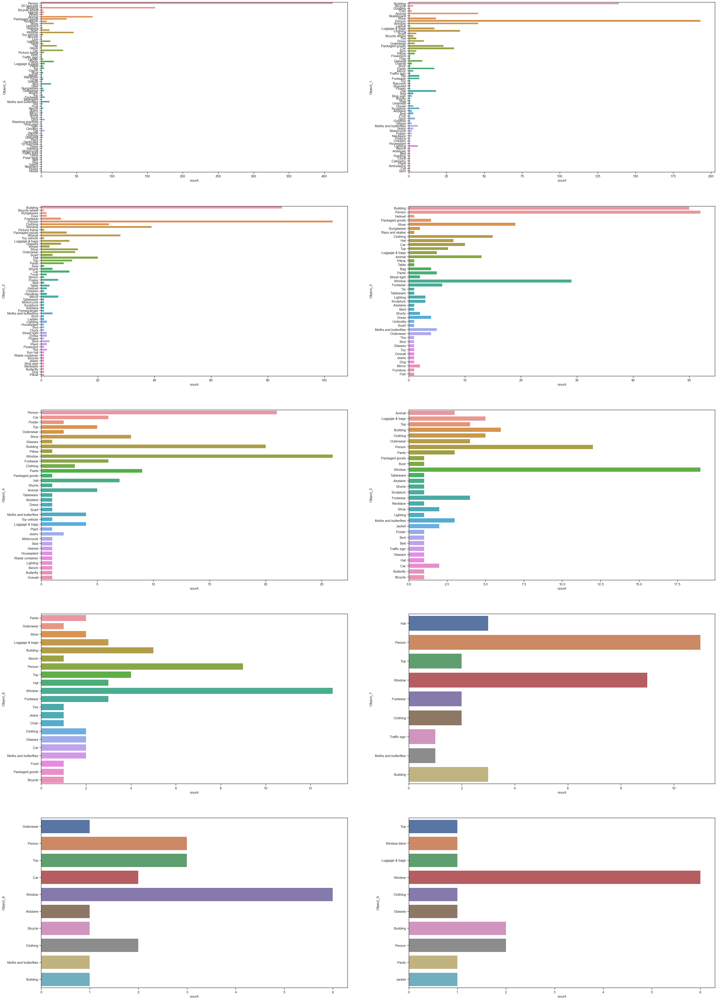

In [ ]:
#Visualizing above graph
fig, axes = plt.subplots(5, 2, figsize=(40,60))
axes = axes.flatten()

ax = sns.countplot(y ='Object_0',  data = Df,  orient='v', ax=axes[0])
ax = sns.countplot(y ='Object_1',  data = Df,  orient='v', ax=axes[1])
ax = sns.countplot(y ='Object_2',  data = Df,  orient='v', ax=axes[2])
ax = sns.countplot(y ='Object_3',  data = Df,  orient='v', ax=axes[3])
ax = sns.countplot(y ='Object_4',  data = Df,  orient='v', ax=axes[4])
ax = sns.countplot(y ='Object_5',  data = Df,  orient='v', ax=axes[5])
ax = sns.countplot(y ='Object_6',  data = Df,  orient='v', ax=axes[6])
ax = sns.countplot(y ='Object_7',  data = Df,  orient='v', ax=axes[7])
ax = sns.countplot(y ='Object_8',  data = Df,  orient='v', ax=axes[8])
ax = sns.countplot(y ='Object_9',  data = Df,  orient='v', ax=axes[9])

The number of objects included per object column and their respective frequncies can be observed visualized above.

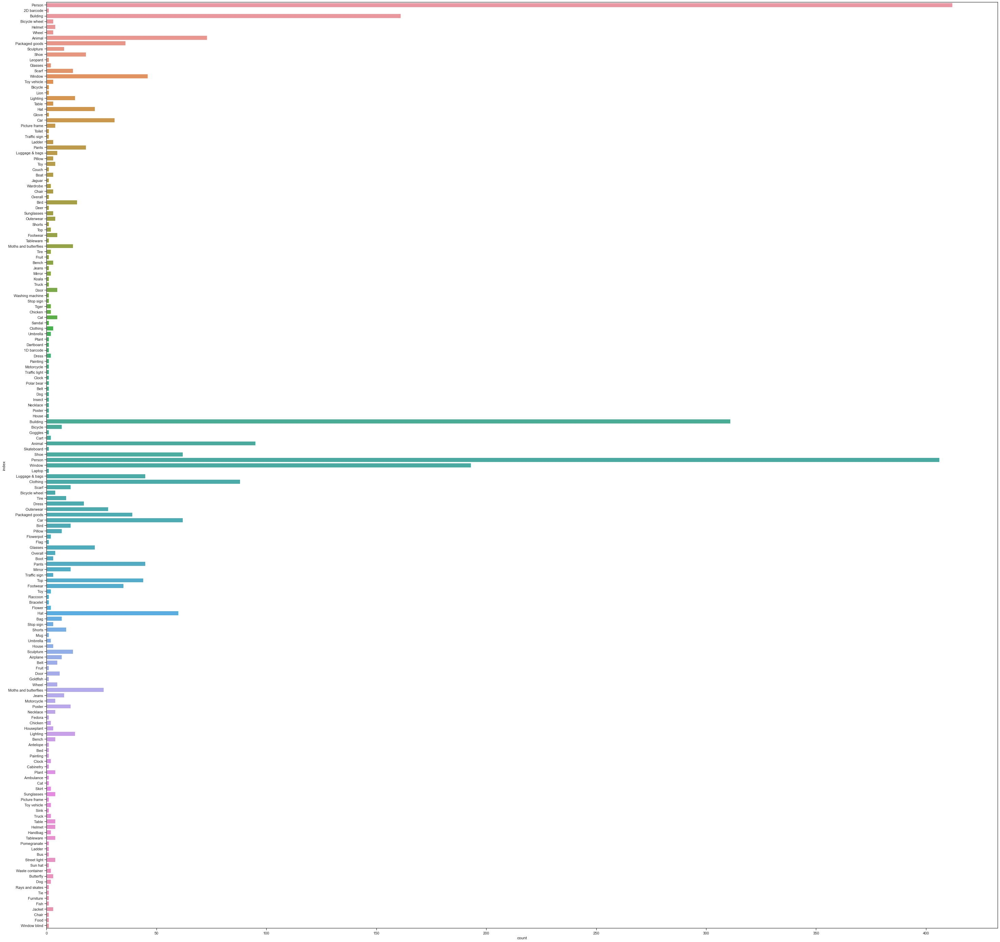

In [ ]:
#Total Object frequency
Object_Df = Df[["Object_0","Object_1","Object_2","Object_3","Object_4","Object_5","Object_6","Object_7","Object_8","Object_9"]]
Object_Df = Object_Df.melt(var_name='columns', value_name='index')
ax = sns.countplot(y ='index',  data = Object_Df)
sns.set(rc={'figure.figsize':(50,50)})

This graph showcases all the objects and their respective frequencies within this dataset.

In [ ]:
Object_Df["index"].value_counts()

Person       412
 Person      406
 Building    311
 Window      193
Building     161
            ... 
Fruit          1
Overall        1
 Raccoon       1
Sandal         1
 Bracelet      1
Name: index, Length: 169, dtype: int64

As seen above there are a plathora of objects in this dataset, if we were to choose to dummify all these variables, we might risk our models metrics. As a result, we can look to see the most occuring variables, and only dummify those. 

### Labels

In [ ]:
for g in range(0,10):
        print(Df["Label_"+str(g)].value_counts())

Sky          252
Building     120
Plant         86
Cloud         76
Window        35
            ... 
Jeans          1
Hood           1
Human          1
Nature         1
Brickwork      1
Name: Label_0, Length: 130, dtype: int64
 Sky               137
 Building          129
 Cloud              72
 Art                69
 Window             62
                  ... 
 Working animal      1
 Fin                 1
 Product             1
 Cartoon             1
 Red                 1
Name: Label_1, Length: 152, dtype: int64
 Art         95
 Building    88
 Window      82
 Sky         57
 Plant       46
             ..
 Product      1
 Symmetry     1
 Insect       1
 Shoe         1
 Flooring     1
Name: Label_2, Length: 170, dtype: int64
 Art          127
 Building      59
 Graffiti      42
 Window        39
 Plant         38
             ... 
 Reptile        1
 Lip            1
 Hairstyle      1
 Shelving       1
 Red            1
Name: Label_3, Length: 192, dtype: int64
 Art              113


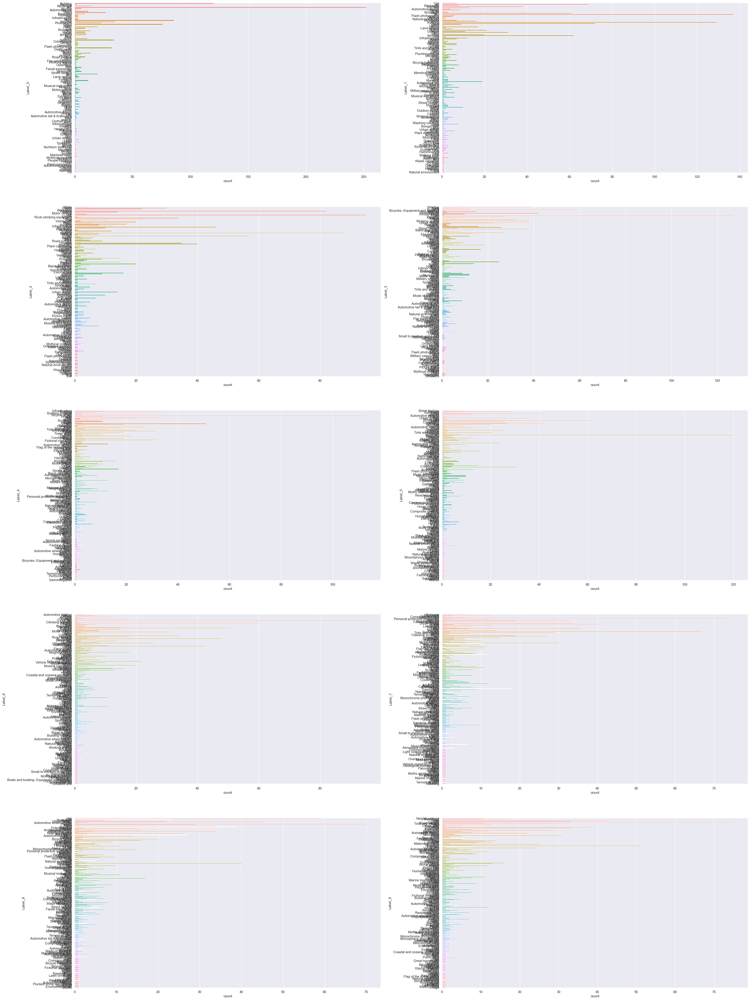

In [ ]:
fig, axes = plt.subplots(5, 2, figsize=(40,60))
axes = axes.flatten()

ax = sns.countplot(y ='Label_0',  data = Df,  orient='v', ax=axes[0])
ax = sns.countplot(y ='Label_1',  data = Df,  orient='v', ax=axes[1])
ax = sns.countplot(y ='Label_2',  data = Df,  orient='v', ax=axes[2])
ax = sns.countplot(y ='Label_3',  data = Df,  orient='v', ax=axes[3])
ax = sns.countplot(y ='Label_4',  data = Df,  orient='v', ax=axes[4])
ax = sns.countplot(y ='Label_5',  data = Df,  orient='v', ax=axes[5])
ax = sns.countplot(y ='Label_6',  data = Df,  orient='v', ax=axes[6])
ax = sns.countplot(y ='Label_7',  data = Df,  orient='v', ax=axes[7])
ax = sns.countplot(y ='Label_8',  data = Df,  orient='v', ax=axes[8])
ax = sns.countplot(y ='Label_9',  data = Df,  orient='v', ax=axes[9])

The number of labels included per label column, and their respective frequncies can be observed visualized above.

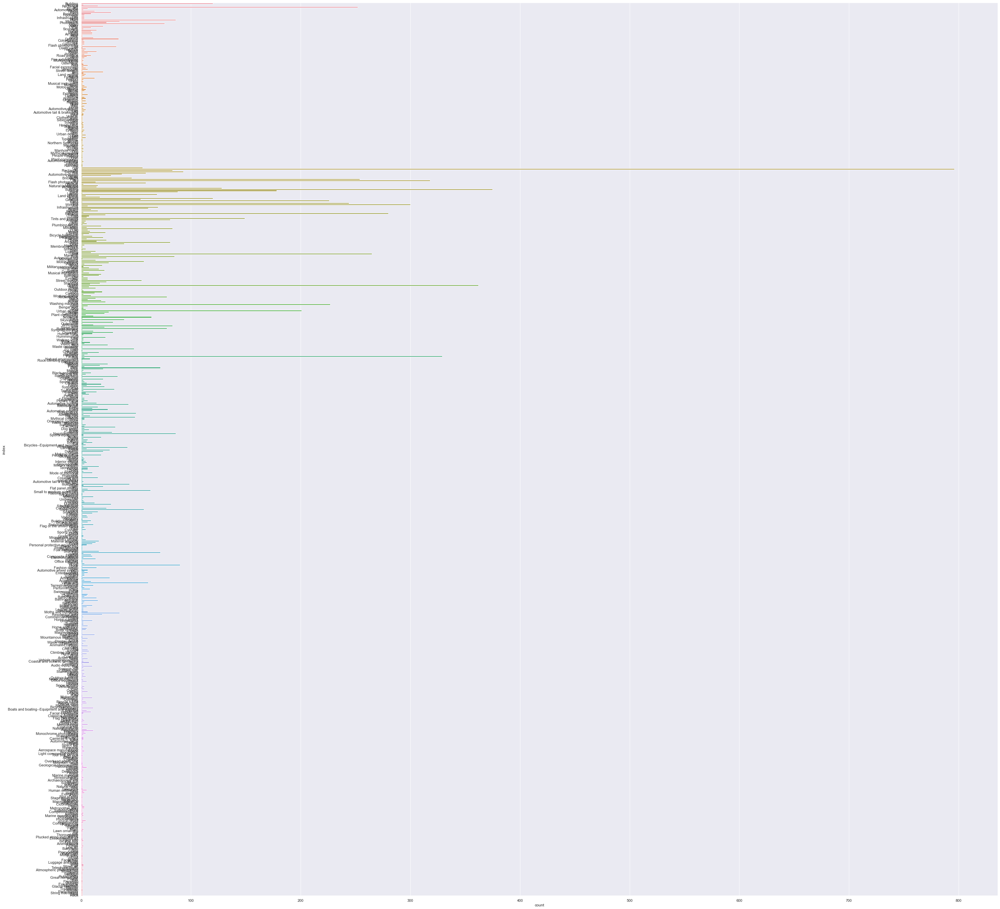

In [ ]:
#Total Object frequency
Label_Df = Df[["Label_0","Label_1","Label_2","Label_3","Label_4","Label_5","Label_6","Label_7","Label_8","Label_9"]]
Label_Df = Label_Df.melt(var_name='columns', value_name='index')
ax = sns.countplot(y ='index',  data = Label_Df)
sns.set(rc={'figure.figsize':(50,50)})

This graph showcases all the labels and their respective frequencies within this dataset.

In [ ]:
Label_Df['index'].value_counts()

 Art                             796
 Building                        375
 Graffiti                        362
 Facade                          329
 Sky                             318
                                ... 
 Lip                               1
 Flag Day (USA)                    1
 Shoe                              1
Automotive tail & brake light      1
 Design                            1
Name: index, Length: 706, dtype: int64

In [ ]:
Label_Df['index'].value_counts().describe()

count    706.000000
mean      15.396601
std       51.021438
min        1.000000
25%        1.000000
50%        2.000000
75%        9.000000
max      796.000000
Name: index, dtype: float64

In [ ]:
d = Label_Df['index'].value_counts()
Label_Count = pd.DataFrame(data=d)

As seen above there are over 700 labels in this dataset. Dummifying all of these variables, could jeapordize the credibility of this model. As a result, we will only keep labels that appear in the dataset more than 200 times.

In [ ]:
a = Label_Count.index[Label_Count["index"] > 200]
List = []
for i in a:
    i = i.strip()
    List.append(i)
List

['Art',
 'Building',
 'Graffiti',
 'Facade',
 'Sky',
 'Window',
 'Painting',
 'Wall',
 'Plant',
 'Sky',
 'Font',
 'Tree',
 'Paint',
 'Urban design']

This leaves us with the variables above.

## Pre-processing 

## Labels

In [ ]:
import numpy as np
for i in List:
    Df[i] = np.nan
    print(Df[i])

0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
        ..
1082   NaN
1083   NaN
1084   NaN
1085   NaN
1086   NaN
Name: Art, Length: 1087, dtype: float64
0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
        ..
1082   NaN
1083   NaN
1084   NaN
1085   NaN
1086   NaN
Name: Building, Length: 1087, dtype: float64
0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
        ..
1082   NaN
1083   NaN
1084   NaN
1085   NaN
1086   NaN
Name: Graffiti, Length: 1087, dtype: float64
0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
        ..
1082   NaN
1083   NaN
1084   NaN
1085   NaN
1086   NaN
Name: Facade, Length: 1087, dtype: float64
0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
        ..
1082   NaN
1083   NaN
1084   NaN
1085   NaN
1086   NaN
Name: Sky, Length: 1087, dtype: float64
0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
        ..
1082   NaN
1083   NaN
1084   NaN
1085   NaN
1086   NaN
Name: Window, Length: 1087, dtype: float64
0      NaN
1      

In [ ]:
for i in range(len(Df)):
    s = Df.iloc[i,49]
    for g in List:
        if (s.find(g)!= -1):
            Df.iloc[i, Df.columns.get_loc(g)] = 1
        else:
            Df.iloc[i, Df.columns.get_loc(g)] = 0

## Objects 

In [ ]:
Df = Df[Df.Object_Num != 0]

Deleting all columns where there are 0 objects. We want to have a minimum of one object for this model

In [ ]:
#Dummifying all Object_Num
Df = pd.get_dummies(Df, columns=["Object_0"])

Text(0.5, 1.0, 'Object = Animal Distribution')

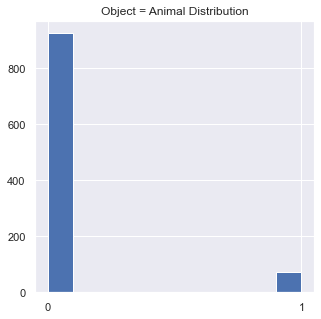

In [ ]:
plt.figure(figsize=(5,5))
plt.xticks((0,1))
Df["Object_0_Animal"].hist()
plt.title("Object = Animal Distribution")

Text(0.5, 1.0, 'Object = Building Distribution')

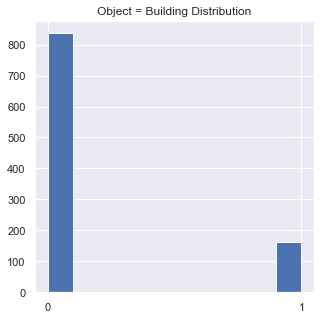

In [ ]:
plt.figure(figsize=(5,5))
plt.xticks((0,1))
Df["Object_0_Building"].hist()
plt.title("Object = Building Distribution")

Text(0.5, 1.0, 'Object = Person Distribution')

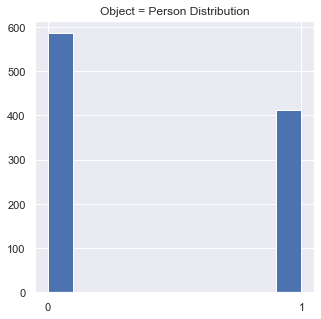

In [ ]:
plt.figure(figsize=(5,5))
plt.xticks((0,1))
Df["Object_0_Person"].hist()
plt.title("Object = Person Distribution")

## Creating new engagement variable

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
Df["Comments"] = scaler.fit_transform(Df[["Comments"]])
Df["Comments"]

0       0.025862
1       0.017241
2       0.017241
4       0.017241
5       0.034483
          ...   
1081    0.215517
1082    0.198276
1083    0.534483
1084    0.155172
1085    0.181034
Name: Comments, Length: 997, dtype: float64

We will standardize number of comments to make the comparison between posts easier.

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
Df["Likes"] = scaler.fit_transform(Df[["Likes"]])
Df["Likes"]

0       0.009258
1       0.005262
2       0.004995
4       0.010190
5       0.009991
          ...   
1081    0.344745
1082    0.290862
1083    0.625283
1084    0.221393
1085    0.161649
Name: Likes, Length: 997, dtype: float64

In [ ]:
We will standardize number of likes to make the comparison between posts more easy.

SyntaxError: invalid syntax (<ipython-input-340-1be62efea957>, line 1)

In [ ]:
Df["Engagement"] = Df["Likes"]+Df["Comments"]
Df["Engagement"]

0       0.035120
1       0.022503
2       0.022237
4       0.027432
5       0.044473
          ...   
1081    0.560262
1082    0.489138
1083    1.159766
1084    0.376566
1085    0.342684
Name: Engagement, Length: 997, dtype: float64

We will create a new engagement variable where both are added. This way we account for both engagement variables, and we dont have information leakage.

Text(0.5, 1.0, 'Engagement Distribution')

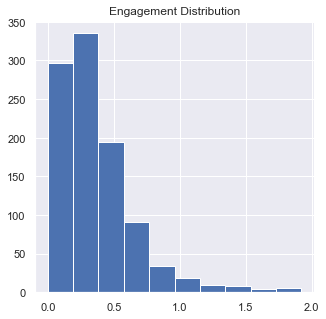

In [ ]:
plt.figure(figsize=(5,5))
Df["Engagement"].hist()
plt.title("Engagement Distribution")

## Deleting all excessive columns

In [ ]:
Df_1 = Df

In [ ]:
for i in range(1,10):
    Df_1 = Df_1.drop(["Object_"+str(i)], axis=1)

In [ ]:
for i in range(0,10):
    Df_1 = Df_1.drop(["Label_"+str(i)], axis=1)

In [ ]:
for i in range(0,10):
    Df_1 = Df_1.drop(["Label_"+str(i)+"_score"], axis=1)

In [ ]:
for i in range(0,10):
    Df_1 = Df_1.drop(["Object_"+str(i)+"_score"], axis=1)

In [ ]:
Df_1 = Df_1.drop(["Unnamed: 0","Caption","Comments","Likes","URL","Total_Objects_Names","Total_Objects_Scores","Label_Num","Labels_Objects_Names","Labels_Objects_Scores"], axis=1)

In [ ]:
#Dropping columns with too little occurrences
for i in Df_1.columns:
    if sum(Df_1[i]) < 50:
        Df_1 = Df_1.drop([i], axis=1)

In [ ]:
Df_1.columns

Index(['Object_Num', 'Engagement', 'Art', 'Building', 'Graffiti', 'Facade',
       'Sky', 'Window', 'Painting', 'Wall', 'Plant', 'Font', 'Tree', 'Paint',
       'Urban design', 'Object_0_Animal', 'Object_0_Building',
       'Object_0_Person'],
      dtype='object')

In [ ]:
#Testing
Df_1[Df_1["Graffiti"] == 1]

,Object_Num,Engagement,Art,Building,Graffiti,Facade,Sky,Window,Painting,Wall,Plant,Font,Tree,Paint,Urban design,Object_0_Animal,Object_0_Building,Object_0_Person
1,1,0.022503,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,1
5,7,0.044473,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0
8,3,0.039154,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0,0,1
9,2,0.079432,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1,0,0
12,2,0.161927,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1054,2,0.409269,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1,0,0
1056,3,0.392209,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,0,1
1062,4,0.662967,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0,0,1
1063,2,0.253793,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0,0,0


In [ ]:
Df_1[Df_1["Graffiti"] == ""]

,Object_Num,Engagement,Art,Building,Graffiti,Facade,Sky,Window,Painting,Wall,Plant,Font,Tree,Paint,Urban design,Object_0_Animal,Object_0_Building,Object_0_Person


In [ ]:
for i in Df_1.columns:
    print(Df_1[i].value_counts())

1     271
2     259
3     194
4     124
5      59
6      30
7      26
10     17
8      13
9       4
Name: Object_Num, dtype: int64
0.023635    3
0.034321    3
0.003730    2
0.012484    2
0.035786    2
           ..
0.055892    1
0.282958    1
0.118043    1
0.278895    1
0.000000    1
Name: Engagement, Length: 982, dtype: int64
1.0    769
0.0    228
Name: Art, dtype: int64
0.0    534
1.0    463
Name: Building, dtype: int64
0.0    662
1.0    335
Name: Graffiti, dtype: int64
0.0    695
1.0    302
Name: Facade, dtype: int64
1.0    532
0.0    465
Name: Sky, dtype: int64
0.0    685
1.0    312
Name: Window, dtype: int64
0.0    734
1.0    263
Name: Painting, dtype: int64
0.0    752
1.0    245
Name: Wall, dtype: int64
0.0    689
1.0    308
Name: Plant, dtype: int64
0.0    779
1.0    218
Name: Font, dtype: int64
0.0    788
1.0    209
Name: Tree, dtype: int64
0.0    635
1.0    362
Name: Paint, dtype: int64
0.0    818
1.0    179
Name: Urban design, dtype: int64
0    924
1     73
Name: Object_0_Ani

## Random Forest Regressor Model

In [ ]:
## Train Test Split 

from sklearn.model_selection import train_test_split
train, test = train_test_split(Df_1, test_size=0.3, random_state=42)
print(len(train))
print(len(test))

697
300


In [ ]:
train

,Object_Num,Engagement,Art,Building,Graffiti,Facade,Sky,Window,Painting,Wall,Plant,Font,Tree,Paint,Urban design,Object_0_Animal,Object_0_Building,Object_0_Person
921,1,0.485770,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0,0,1
681,3,1.348842,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1
424,1,0.334128,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0,1,0
1012,7,0.262557,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0
644,3,0.390553,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113,1,0.034321,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0,0,1
289,1,0.209244,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0,0,1
939,2,0.420238,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0,0,1
469,1,0.186494,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0


In [ ]:
test

,Object_Num,Engagement,Art,Building,Graffiti,Facade,Sky,Window,Painting,Wall,Plant,Font,Tree,Paint,Urban design,Object_0_Animal,Object_0_Building,Object_0_Person
488,5,0.240873,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0,1
862,5,0.764713,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1
220,1,0.010019,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0,0,1
330,4,0.354709,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,1
803,1,0.593281,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
335,1,0.261796,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1
434,1,0.405283,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0
8,3,0.039154,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0,0,1
165,3,0.002997,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0,0,0


In [ ]:
miss_values_train = missing_values(test)
miss_values_test = missing_values(train)
miss_values_train
miss_values_test

Dataframe has 18 columns.
There are 0 columns that have missing values.
Dataframe has 18 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


In [ ]:
y_train = train['Engagement']
X_train = train.drop(columns=['Engagement'])

y_test = test['Engagement']
X_test = test.drop(columns=['Engagement'])

In [ ]:
# Import the model we are using
from sklearn.ensemble import RandomForestRegressor
# Instantiate model with 1000 decision trees
rf = RandomForestRegressor(n_estimators = 1000, random_state = 42)
# Train the model on training data
rf.fit(X_train, y_train)

RandomForestRegressor(n_estimators=1000, random_state=42)

### Metrics for model

In [ ]:
preductions = rf.predict(X_test)
# Evaluating the Algorithm
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, predictions))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, predictions))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

Mean Absolute Error: 0.2568154024325381
Mean Squared Error: 0.12115778101688335
Root Mean Squared Error: 0.348077262999012


This model seems to be performing quite well!! The MAE and MSE scores for this model are quite good. It can be further refined with information from more posts, and more objects and labels added with higher accuracy.

### Feature Importance

In [ ]:
importance = rf.feature_importances_

In [ ]:
importance

array([0.19891683, 0.05073889, 0.0527805 , 0.04021834, 0.05322537,
       0.07360637, 0.04986304, 0.03659429, 0.05254974, 0.06089315,
       0.05757493, 0.05357472, 0.04322465, 0.04512719, 0.03246137,
       0.0361664 , 0.06248423])

Feature: 0, Score: 0.19892
Feature: 1, Score: 0.05074
Feature: 2, Score: 0.05278
Feature: 3, Score: 0.04022
Feature: 4, Score: 0.05323
Feature: 5, Score: 0.07361
Feature: 6, Score: 0.04986
Feature: 7, Score: 0.03659
Feature: 8, Score: 0.05255
Feature: 9, Score: 0.06089
Feature: 10, Score: 0.05757
Feature: 11, Score: 0.05357
Feature: 12, Score: 0.04322
Feature: 13, Score: 0.04513
Feature: 14, Score: 0.03246
Feature: 15, Score: 0.03617
Feature: 16, Score: 0.06248


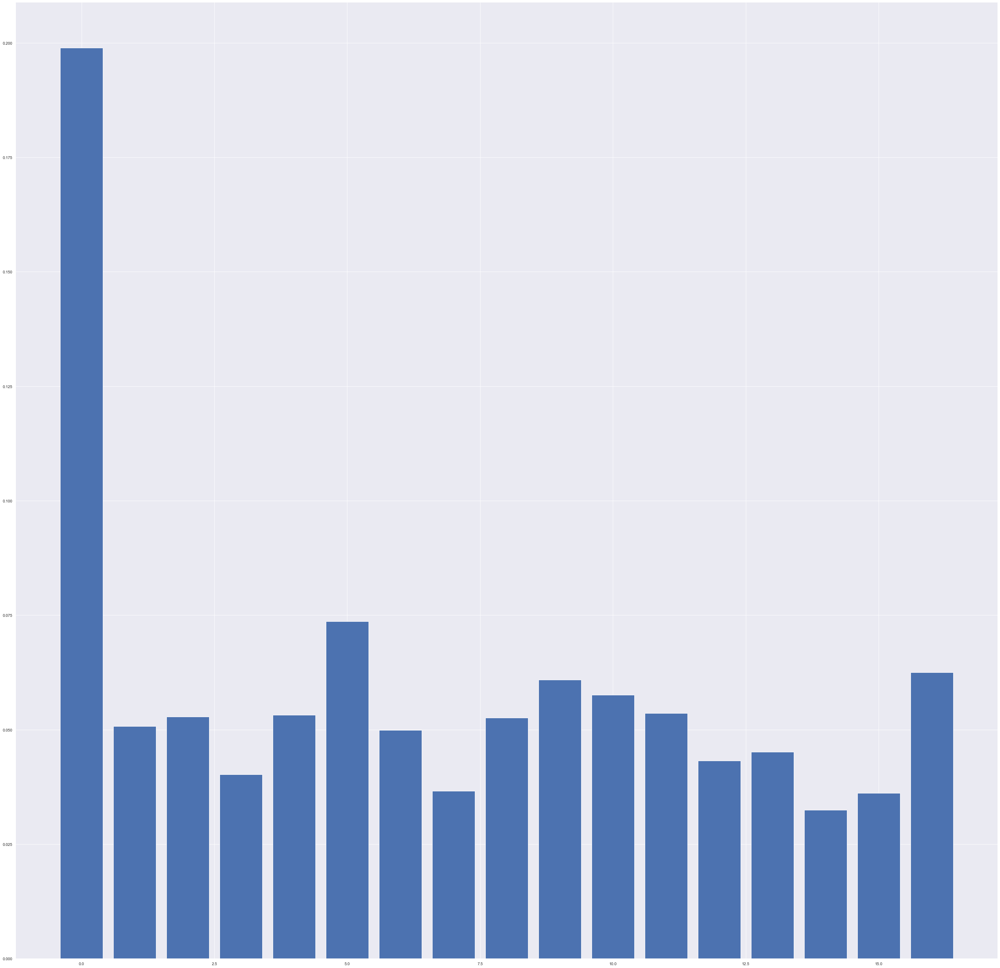

In [ ]:
import matplotlib.pyplot as plt
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

<AxesSubplot:>

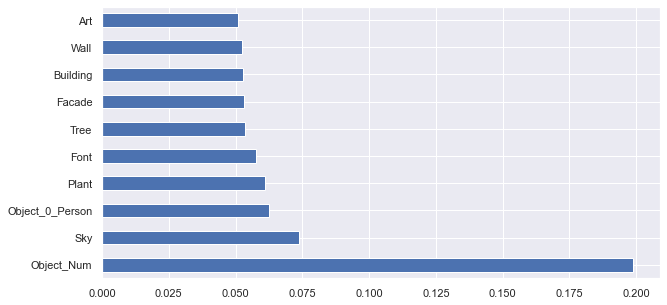

In [ ]:
(pd.Series(rf.feature_importances_, index=X_train.columns)).nlargest(10).plot(kind='barh',figsize=(10,5))

These variables aid in engagement the most.

## Random Forest Classification Model

We also wanted to simplify our model to see if we could get even better results.

#### Creating binary variable

To create a classification model we created a binary variable that is 1 for above average engagement, and 0 for below average engagement. 

In [ ]:
Df_1['Binary_Engagement'] = np.where(Df_1['Engagement'] >= Df["Engagement"].mean(), 1, 0)
Df_1['Binary_Engagement']

0       0
1       0
2       0
4       0
5       0
       ..
1081    1
1082    1
1083    1
1084    1
1085    0
Name: Binary_Engagement, Length: 997, dtype: int64

In [ ]:
## Train Test Split 

from sklearn.model_selection import train_test_split
train, test = train_test_split(Df_1, test_size=0.3, random_state=42)
print(len(train))
print(len(test))

697
300


In [ ]:
y_train = train['Binary_Engagement']
X_train = train.drop(columns=['Engagement','Binary_Engagement'])

y_test = test['Binary_Engagement']
X_test = test.drop(columns=['Engagement','Binary_Engagement'])

In [ ]:
# Import the model we are using
from sklearn.ensemble import RandomForestClassifier
# Instantiate model with 1000 decision trees
rf = RandomForestClassifier(n_estimators = 1000, random_state = 42)
# Train the model on training data
rf.fit(X_train, y_train)

RandomForestClassifier(n_estimators=1000, random_state=42)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
pred = rf.predict(X_test)
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))
print(accuracy_score(y_test, pred))

[[122  44]
 [ 88  46]]
              precision    recall  f1-score   support

           0       0.58      0.73      0.65       166
           1       0.51      0.34      0.41       134

    accuracy                           0.56       300
   macro avg       0.55      0.54      0.53       300
weighted avg       0.55      0.56      0.54       300

0.56


The metrics for this are not as strong as the regressor model.

## Feature Importance

In [ ]:
importance = rf.feature_importances_
importance

array([0.22491698, 0.04949886, 0.05122102, 0.05619245, 0.05404358,
       0.05506193, 0.05244243, 0.03597324, 0.05250904, 0.05549873,
       0.0575099 , 0.05219379, 0.0416994 , 0.04355636, 0.02553787,
       0.03379175, 0.05835268])

Feature: 0, Score: 0.22492
Feature: 1, Score: 0.04950
Feature: 2, Score: 0.05122
Feature: 3, Score: 0.05619
Feature: 4, Score: 0.05404
Feature: 5, Score: 0.05506
Feature: 6, Score: 0.05244
Feature: 7, Score: 0.03597
Feature: 8, Score: 0.05251
Feature: 9, Score: 0.05550
Feature: 10, Score: 0.05751
Feature: 11, Score: 0.05219
Feature: 12, Score: 0.04170
Feature: 13, Score: 0.04356
Feature: 14, Score: 0.02554
Feature: 15, Score: 0.03379
Feature: 16, Score: 0.05835


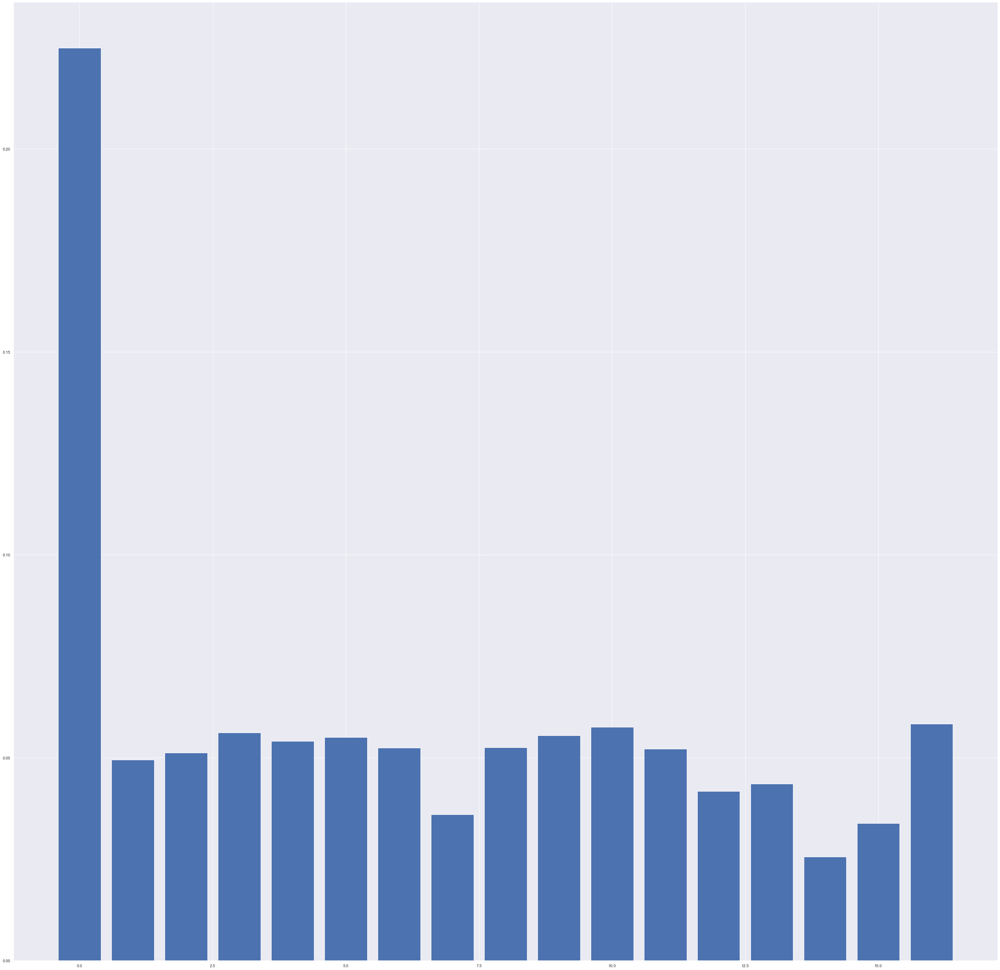

In [ ]:
import matplotlib.pyplot as plt
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

<AxesSubplot:>

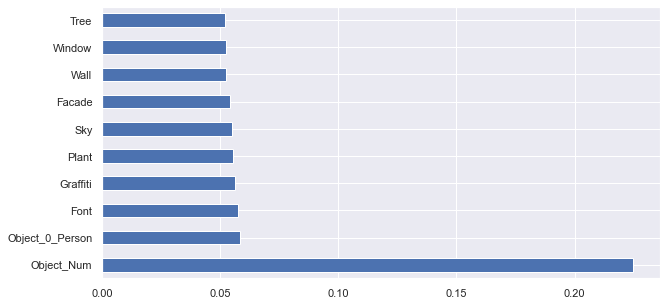

In [ ]:
(pd.Series(rf.feature_importances_, index=X_train.columns)).nlargest(10).plot(kind='barh',figsize=(10,5))

Feature Importance is very similar to regrssor with some small changes.

Overall the regressor model seems to have much better performance.